<h1>1. Business Problem</h1>

# 2.  Data Analysis

**1. Unique Values:**
Lets look at the numnber of unique values we have in each column/feature. Since this data is numberical we may expect to find a lot of variable data (meaning not same values).
Variable: Since each of the columns in the dataset refers to a measuerment about each case, we will refer to the column as a variable.

In [19]:
print("The unique number of data values are")
df.nunique()

The unique number of data values are


id                         569
diagnosis                    2
radius_mean                456
texture_mean               479
perimeter_mean             522
area_mean                  539
smoothness_mean            474
compactness_mean           537
concavity_mean             537
concave points_mean        542
symmetry_mean              432
fractal_dimension_mean     499
radius_se                  540
texture_se                 519
perimeter_se               533
area_se                    528
smoothness_se              547
compactness_se             541
concavity_se               533
concave points_se          507
symmetry_se                498
fractal_dimension_se       545
radius_worst               457
texture_worst              511
perimeter_worst            514
area_worst                 544
smoothness_worst           411
compactness_worst          529
concavity_worst            539
concave points_worst       492
symmetry_worst             500
fractal_dimension_worst    535
dtype: i

 Variable: Since each of the columns in the dataset refers to a measuerment about each case, we will refer to the column as a variable.

**2. Data Spread between the two types:**
Its important to understand the way teh data is spread between each type(malignant vs benign). One way to acheive this it to count the total number of 1's in the diagnosis column. (1 represents the malignant data point), Getting the mean of the '"diagnosis" column and multiplying it by 100  will give the percentage of data points that belong to the malignant type

In [28]:
df["diagnosis"].value_counts()
print(df["diagnosis"].mean())
#print("Percentage of malignant type dataset is = ",df["diagnosis"].mean()*100)
#This also serves as a sanity check to "diagnosis" column is correctly assigned with Malignant as 1 and Benign as 0

0.37258347978910367


Total number of data points =   569
Malignant (diagnosis =1) = 37.3%
Benign (diagnosis =0)= 62.7%


<AxesSubplot:title={'center':'Malignant (1) vs Benign Data(0) points'}, xlabel='diagnosis', ylabel='Number of data points'>

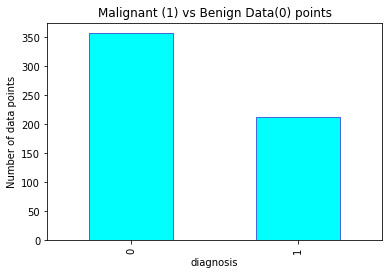

In [21]:
#Plot the number of data points with mailgnant and benign as their diagnosis
print("Total number of data points =  ", len(df))

print("Malignant (diagnosis =1) = {}%".format(round(df["diagnosis"].mean(),3)*100))
                             
print("Benign (diagnosis =0)= {}%".format((1-round(df["diagnosis"].mean(),3))*100))

df.groupby("diagnosis")['id'].count().plot.bar(ylabel = "Number of data points", title = "Malignant (1) vs Benign Data(0) points", color = 'cyan', edgecolor = "royalblue")


**Observation**: Data is not severly imbalanced

**3. Correlation Matrix:**
One of the assumptions in most of the key Machine learning models is that no variable in the model is highy correlated to any other variable. A high correlation between variables causes the problem of 'multicollinearity' and hence its important to be aware of the relationsships between each variable to better interpret the results of a model.  

Pearsons Correlation Coeffecient:
One way to quantify the relationship between given two variables is a Pearson correlation coeffecient which is a measure of linear relation and has a values betweeen -1 and 1. 

    -1 indicates a perfectly negative linear correlation between two variables

    0 indicates no linear correlation between two variables

    1 indicates a perfectly positive linear correlation between two variables

Correlation Matrix:
A coorelation matrix shows the relation between two given variables in the form of a matrix. Sucha a matrix colored with a heat map will make it much easier to read.
For this data, we will use the sklearn implentation of correlattion matrix which uses the Pearson Correlation Coeffecient as its default. 

Diagnoal Correlation Matrix:
Since the correlation matrix is symmetrical, half of the coeffecients are redundant. So, a diagnoal correlation matrix can be used for an quick and easy viewing. 


Reference: https://www.statology.org/how-to-read-a-correlation-matrix/

In [29]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

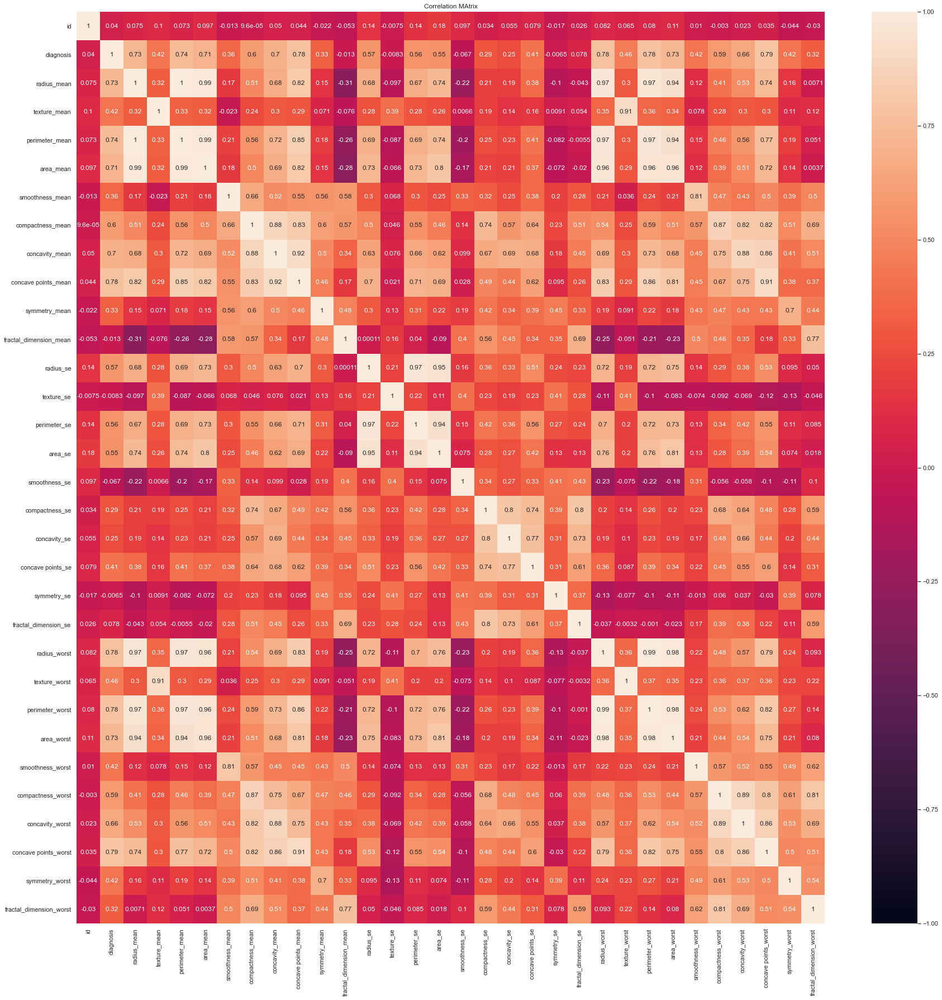

In [32]:
#HEATMAP
import seaborn as sns
import matplotlib
import matplotlib.pylab as plt

plt.figure(figsize =(30,30))
sns.heatmap(df.corr(), vmin=-1, vmax=1, annot=True)
plt.title("Correlation MAtrix")
plt.show()

Though, I personally like this plot but interpreting such a plot can be tedious when we have multiple variable(features) and we move the plot back and forth to compare all values. So another way to view such plots is to plot a diagonal correlation matrix. But the inferences from both are esentially the same, however more information can be obtained using the first plot.

**Obervations:**
In a corrleation hat map, the way its interpreted is higher the corrlelation value, the more correlated the two variables(features) are
1. Radius, Area and Permiter are correlated (corr>0.9) which is obvious as area and perimeter is calculated using the radius values.

2. Texture_mean and texture_worst are higly correlated with corr_value = 0.98 (texture_worst is the largest value of all the textures)

3. Compactness_mean,concavity_mean,concave_points_mean are also highy correlated with values in range 0.7 to 0.9

4. Symmetry_mean and symmetry_worst are correlated too by values 0.7

5. Fractural_dimension_mean and fractural_dimension_worst are correlated by value 0.77


Lets analyse these features in more depth by looking at distribution plots of each of these features. We could look at them in the same grouped order to keep our thoughts in flow.

Text(0.5, 1.0, 'Diagnoal Plot')

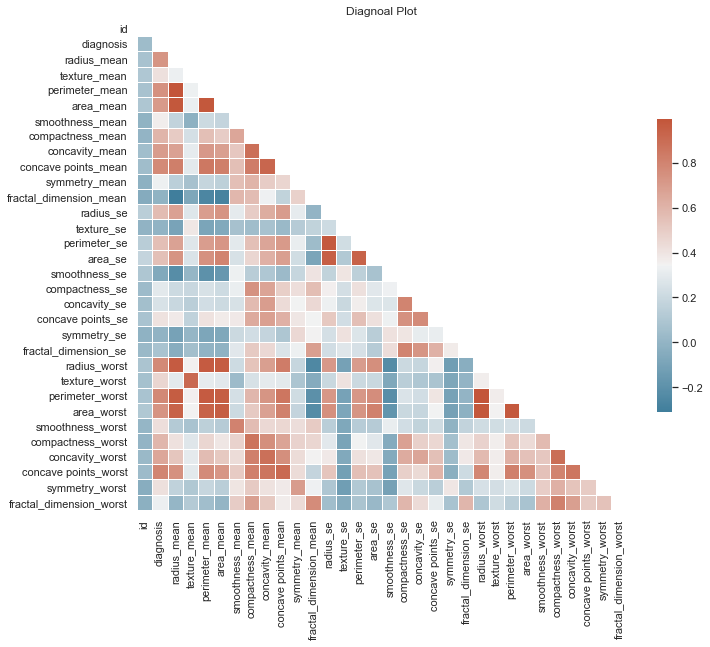

In [35]:
#Diagonal Plot
#https://seaborn.pydata.org/examples/many_pairwise_correlations.html

sns.set_theme(style="white")

corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap,square=True, linewidths=.5, cbar_kws={"shrink": .6})
plt.title("Diagnoal Plot")

**4. Pair Plots:**
Pair plots allows us to see both distribution of single variables and relation between a pair of variables from the given set of variables/features in a form of a matrix

The key reason to use a pair of plots is that humans have a capacity to understand relation between two variables using single plot like a 2D scatter plot or a KDE plot. One can use 3D plots to visualize relationship between 3 given variables. But real-world data, as in our case, has more than 3 variables. So a good approach is to study relationships between a given pair of features. Seaborn's pairplot feature comes in handy in such cases and is widely used. 


Creating a pair plot with 30 features is time consuming. So, we will use just the "mean" values of the given feartures to get an idea of the distributions. 
  

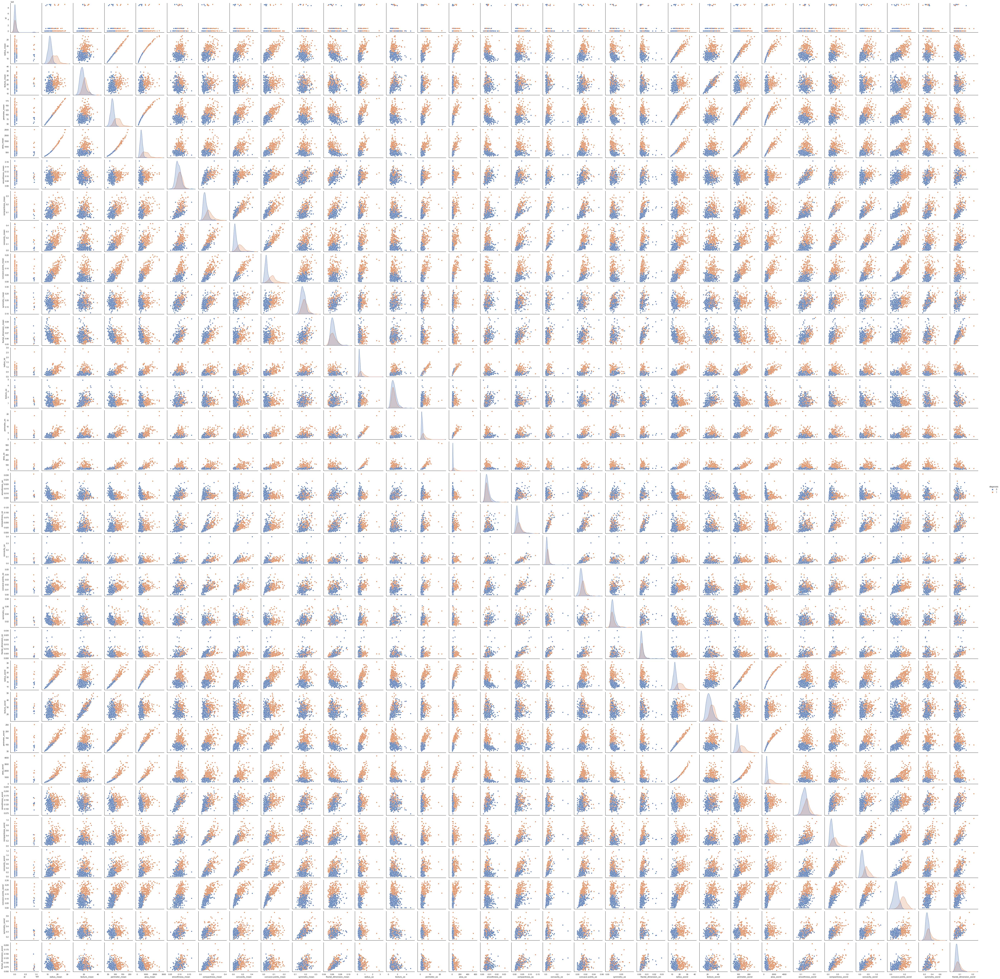

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
#PAIRPLOT OF THE WHOLE DATAFRAME - TAKES A LONG TIME TO COMPUTE
sns.pairplot(df, hue = "diagnosis", diag_kind='kde')
plt.show()
# NOTE: the diagonal elements are PDFs for each feature.

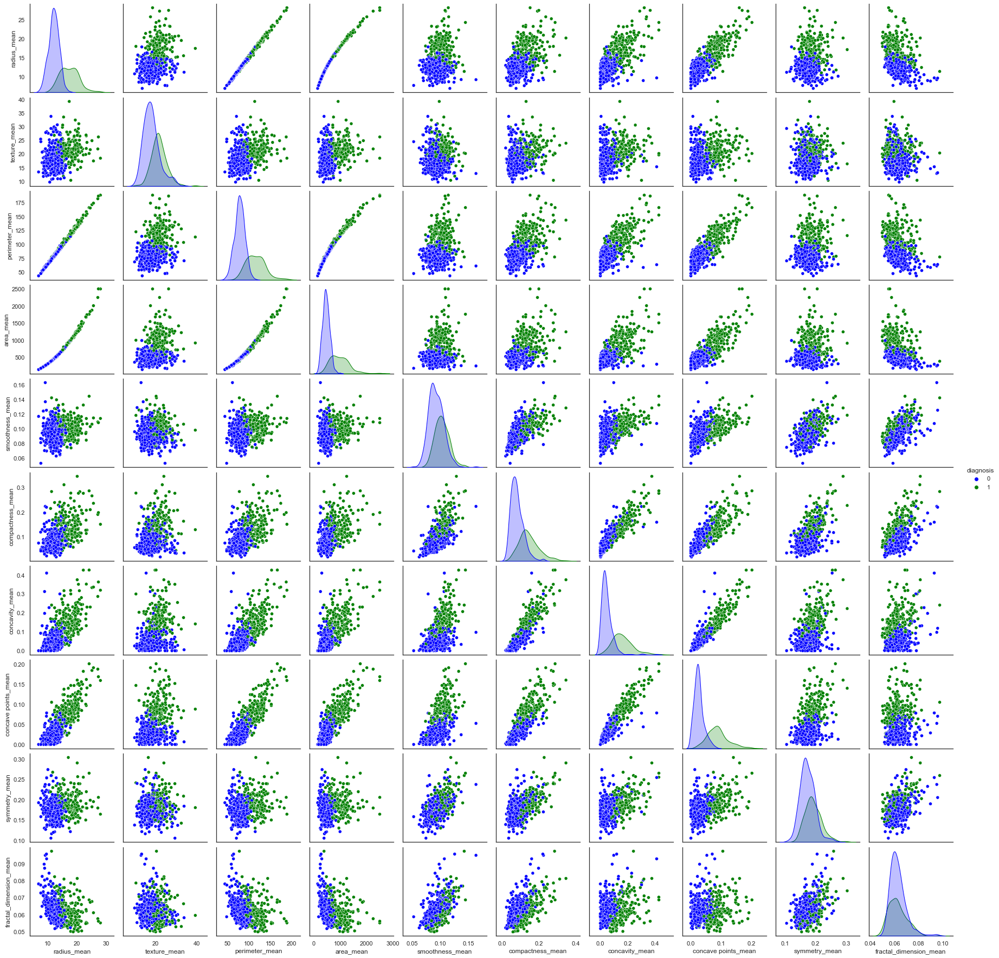

In [38]:
#PAIR PLOTS of mean values
columns_mean=('diagnosis', 'radius_mean','texture_mean', 'perimeter_mean','area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean')
df_mean = pd.DataFrame(df,columns = columns_mean)

sns.pairplot(df_mean, hue = "diagnosis", diag_kind='kde',palette = ["blue","green"])


**Observation**
The diagnol plots are the kde plots for each varible/feature.
The upper and the lower triangle are essentially mirror images of each other.

One major take-away from these plots to observe that  there is a certian level of separation between the malignant and the benign types which can make it helpful to use these features to design a ML alogorithm

**5. Density plots:**

These are smoothened versions of a histogram which plots the values of a feature/column in equally binned distrubutions and then smoothens it using kernel smoothing to create a well defined distribution shape.

Violin Plots and Box Plots:
Box Plot: A box plot gives a information about the variabibnlity and dispersion of the data in the form of a box
THe middle line respresents the median value and with the first and third quarltile on either ends. The Minimum and the Maximum are represented by lines on either side of the box. THe 
Violin Plots has the advantage of comibing this data with its density plots hence allowing us to see the entirity of the distrubution of the data in one plot. 

A combination of all these plots will help visualize the distributions of the data which act as important tools to help design the features to build a machine learning algorithms. This also helps in interpretiing the results of a given alogorithm.

We will use the sklearn and seaborn for creating and visualization of each of these plots.

In [39]:
def get_box_dist_plot(x):
    '''This will give a box plot and a distplot one below the other'''
    f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
    sns.boxplot(x, ax=ax_box)
    sns.distplot(x, kde= True)

    ax_box.set(yticks=[])
    sns.despine(ax=ax_hist)
    sns.despine(ax=ax_box, left=True)
    plt.show()
    
#https://python-graph-gallery.com/24-histogram-with-a-boxplot-on-top-seaborn

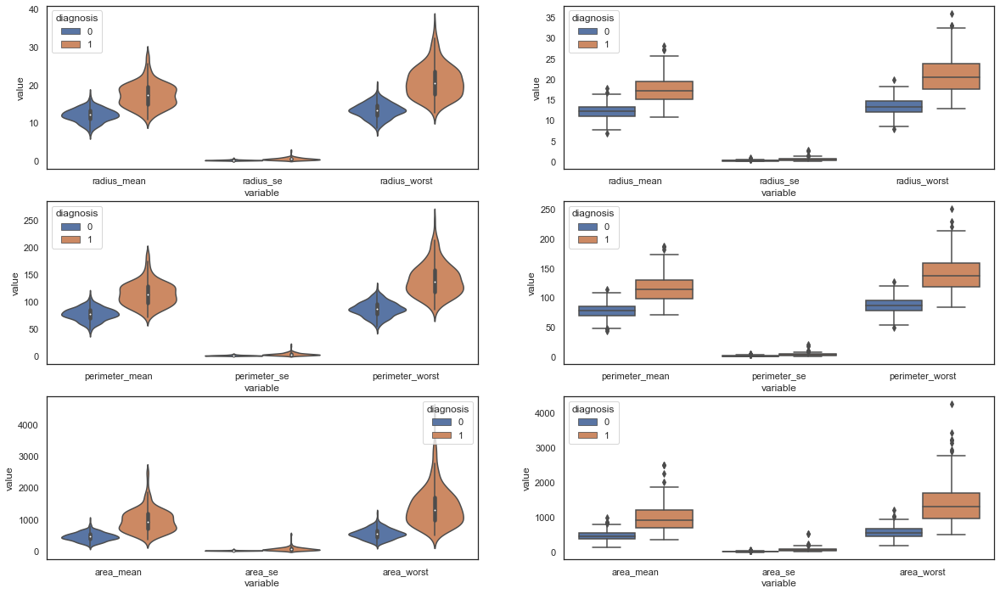

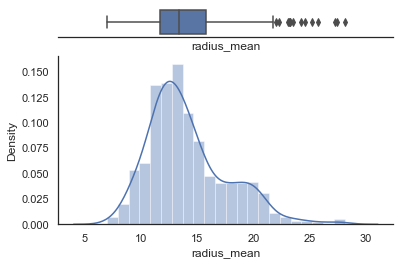

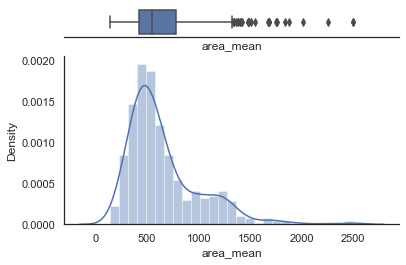

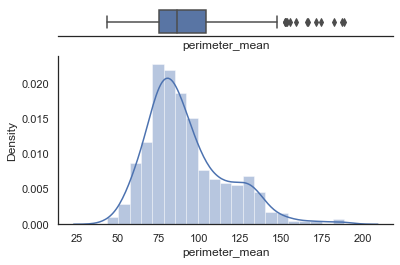

In [40]:
columns_set_1 = ['diagnosis' , 'radius_mean', 'radius_se', 'radius_worst']
df_set_1 = pd.DataFrame(df, columns=columns_set_1)
#df_set_1
columns_set_2 = ['diagnosis' , 'perimeter_mean', 'perimeter_se', 'perimeter_worst']
df_set_2 = pd.DataFrame(df, columns=columns_set_2)
#df_set_2
columns_set_3 = ['diagnosis' , 'area_mean', 'area_se', 'area_worst']
df_set_3 = pd.DataFrame(df, columns=columns_set_3)
#df_set_3

fig, axs = plt.subplots(3 , 2, figsize= (20,12)) #https://dev.to/thalesbruno/subplotting-with-matplotlib-and-seaborn-5ei8 - Example to learn subplots

#Radius
sns.violinplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_1, id_vars='diagnosis'), scale="width", ax = axs[0,0])
sns.boxplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_1, id_vars='diagnosis'), ax = axs[0,1])

#Perimeter
sns.violinplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_2, id_vars='diagnosis'), scale="width", ax = axs[1,0])
sns.boxplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_2, id_vars='diagnosis'), ax = axs[1,1])

#Area
sns.violinplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_3, id_vars='diagnosis'), scale="width",ax = axs[2,0])
sns.boxplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_3, id_vars='diagnosis'),ax = axs[2,1])

#Get Density plots and box plots one below the other 
get_box_dist_plot(df["radius_mean"])
get_box_dist_plot(df["area_mean"])
get_box_dist_plot(df["perimeter_mean"])

**Observations**:
1. Certain level of separation in the values for the radius, perimeter and area in the benign (daignosis = 0) malignant (diagnosis =1)data points (as also observed in the diagnol plot of a pairplot)
2. Each of the features appear to have outliers as shown in the boxplot and therefore needs to be addressed during data preprocessing.
https://towardsdatascience.com/histograms-and-density-plots-in-python-f6bda88f5ac0

3. The distribution appears to be Gaussian with a rigth skew.


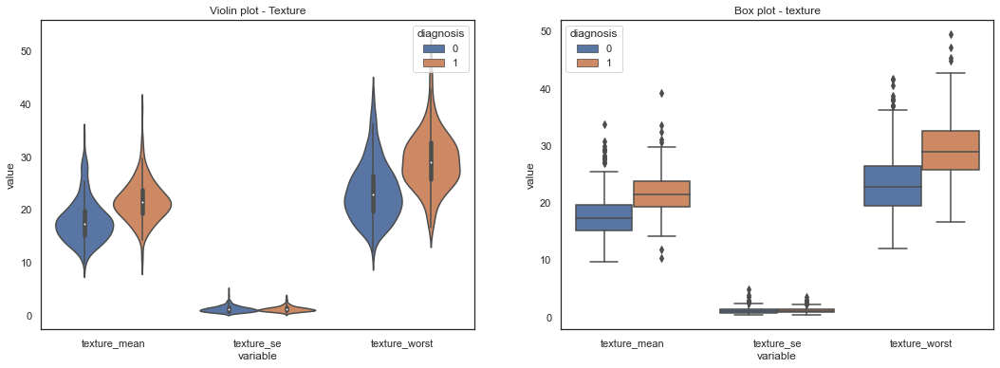

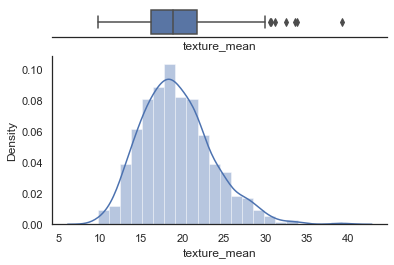

In [41]:
#SET 4 :Texture_mean and texture_worst
columns_set_4 = ['diagnosis' , 'texture_mean', 'texture_se', 'texture_worst']
df_set_4 = pd.DataFrame(df, columns=columns_set_4)
#df_set_4

fig, axs = plt.subplots(1,2, figsize= (18,6))
sns.violinplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_4, id_vars='diagnosis'),scale="width", ax = axs[0])

axs[0].set_title("Violin plot - Texture")
sns.boxplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_4, id_vars='diagnosis'), ax = axs[1])
axs[1].set_title("Box plot - texture")

get_box_dist_plot(df["texture_mean"])


**Observations**:

1. The values for Texture_se fall in the same range both malignant and benign data points.

2. Clear separation in the texture_mean and texture_worst in benign and malignant data points

3. Outliers seen in all three (needs to be addressed in the data preprocessing step)

4. The distribution appears to be a Gaussian distribution  for texture_mean. Such inferences can be made if plotted for texture_se, texture_worst(images now shown here)

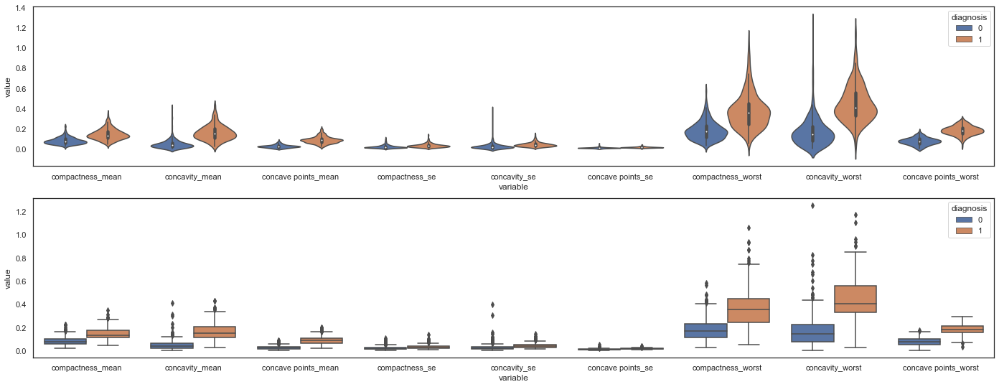

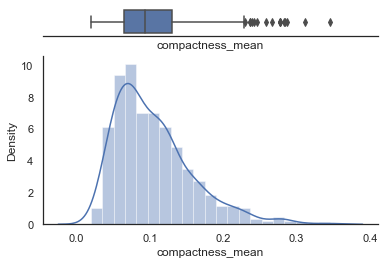

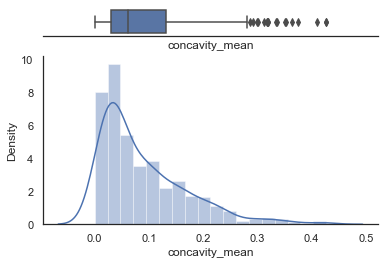

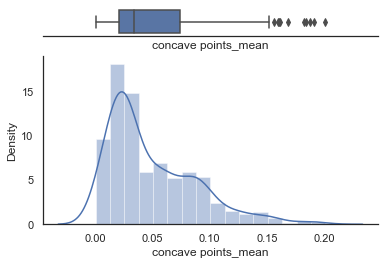

In [42]:
#Set :5 Compactness_mean,concavity_mean,concave_points_mean 
#Compactness and Concavity
columns_set_5 = ['diagnosis','compactness_mean', 'concavity_mean', 'concave points_mean', 'compactness_se', 'concavity_se', 'concave points_se', 'concave points_mean', 'compactness_worst', 'concavity_worst', 'concave points_worst']
df_set_5 = pd.DataFrame(df, columns=columns_set_5)
#df_set_5
fig, axs = plt.subplots(2, figsize= (24,9))
sns.violinplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_5, id_vars='diagnosis'),scale="width", ax = axs[0])

sns.boxplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_5, id_vars='diagnosis'), ax = axs[1])

get_box_dist_plot(df["compactness_mean"])
get_box_dist_plot(df["concavity_mean"])
get_box_dist_plot(df["concave points_mean"])

**Observations**:

1. Certain level of separation in each of the above features.

2. There are outliers in each of these features as shown in the boxplot and therefore needs to be addressed during data preprocessing.

3. The distrubution looks like a Guassian curve with a right skew.

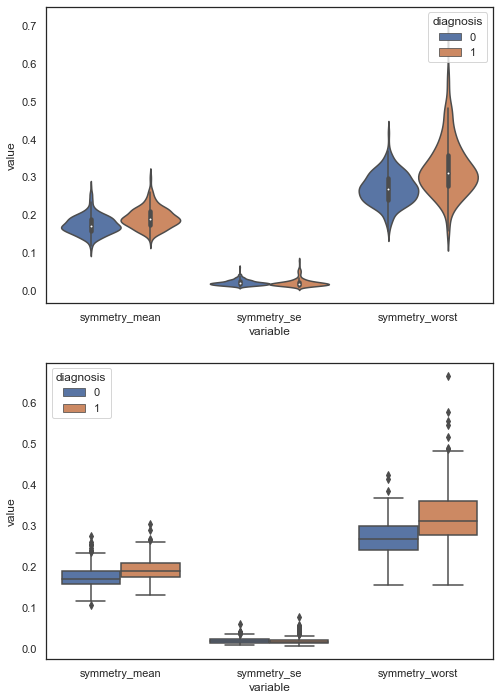

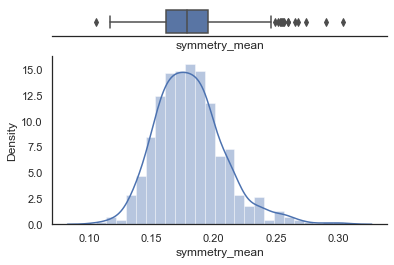

In [43]:
#Set 6: Symmetry_mean and symmetry_worst 
columns_set_6 = ['diagnosis','symmetry_mean', 'symmetry_se', 'symmetry_worst']
df_set_6 = pd.DataFrame(df, columns=columns_set_6)
#df_set_6

fig, axs = plt.subplots(2, figsize= (8,12))
sns.violinplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_6, id_vars='diagnosis'),scale="width", ax = axs[0])
sns.boxplot(x= "variable" ,y = "value", hue= "diagnosis", data=pd.melt(df_set_6, id_vars='diagnosis'), ax = axs[1])

get_box_dist_plot(df["symmetry_mean"])
#f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
#sns.boxplot(df["symmetry_mean"], ax=ax_box)
#sns.histplot(data = df, x ='symmetry_mean', kde= True, hue = "diagnosis")


**Observations**:

1. The values for symmetery_se fall in the same range both malignant and benign data points.

2. Clear separation in the symmetry_mean and symmetry_worst in benign and malignant data points

3. Outliers seen in all three (needs to be addressed in the data preprocessing step)

4. The Pdf looks like Gaussian curve for symmerty_mean. Such inferences can be made if plotted for symmerty_se, symmerty_worst(images now shown here)

**Data Visualization**

Exploring high dimensional data by mapping it to a a new two dimensional plane is another important visualization techniuqe used commonly in machine learning.
The dimensionality reduction can be made in two different ways:
1. Feature Selection : By only keeping the most relevant variables from the original dataset (this technique is called feature selection).
2. Dimension Reduction: By exploiting the redundancy of the input data and by finding a smaller set of new variables, each being a combination of the input variables, containing basically the same information as the input variables.Principal Component Analysis and tSNE are two popular methods used based on this principle.

**Principal Component Analysis(PCA)**
The principal componets are less interepretable and dont have real meaning as they are constructed as linear combinatoins of the initial variables.Geometrically, they represent the directions of data that explain a maximal amount of variance. , thus capturing a most information of data.
Mathematically, the eigenvetors of the covariance matrix (of the features) are the directions of the axes where there is most variance and that we call Principal COmponents and their corresponding eigenvalues gives the amount of variance in each Principal COmponent. 
The compoents are selceted such that the first one has he maximum variance followed by the others in descneding order. 

**tSNE:**
t-distributed stochastic neighbor embedding (t-SNE) is a non linear, statistical method for visualizing high-dimensional data.  It works by embedding each datapoint from the high dimension space to two or three-dimensional map in such a way that similar objects are modeled by nearby points and dissimilar objects are modeled by distant points with high probability.

The t-SNE algorithm comprises two main stages. 
    1. t-SNE constructs a probability distribution over pairs of high-dimensional objects in such a way that similar objects are assigned a higher probability while dissimilar points are assigned a lower probability.
    2.tSNE defines a similar probability distribution over the points in the low-dimensional map, and it minimizes the KL divergence between the two distributions with respect to the locations of the points in the map. 
Perplexity a hyperparameter, is in a sense, a guess about number of close neigbors each point has. A typical value of 5 - 50 has been obseved to a give a robust perfomance.

Projecting the 30-dimensional data to 2D


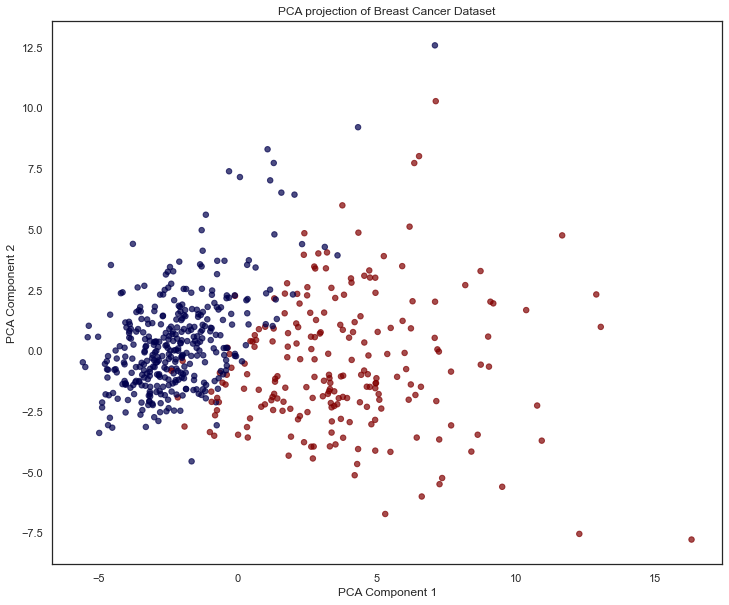

In [44]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X = df.drop(['diagnosis','id'], axis=1) #features
y = df['diagnosis']

X_scaled = StandardScaler().fit_transform(X)

pca = PCA(n_components=2)
X_pca_scaled = pca.fit_transform(X_scaled)

print('Projecting the 30-dimensional data to 2D')

plt.figure(figsize=(12,10))
plt.scatter(X_pca_scaled[:, 0], X_pca_scaled[:, 1], c=df['diagnosis'], alpha=0.7, s=30, cmap = 'seismic');
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA projection of Breast Cancer Dataset');

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 569 samples in 0.000s...
[t-SNE] Computed neighbors for 569 samples in 0.025s...
[t-SNE] Computed conditional probabilities for sample 569 / 569
[t-SNE] Mean sigma: 1.414330
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.945763
[t-SNE] KL divergence after 500 iterations: 1.012639


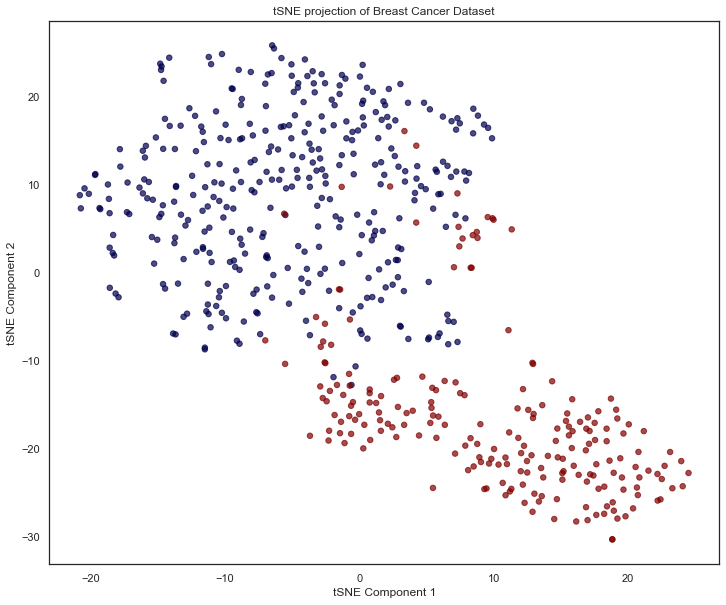

In [45]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

X = df.drop(['diagnosis','id'], axis=1) #features
y = df['diagnosis']

X_scaled = StandardScaler().fit_transform(X)

tSNE = TSNE(n_components=2, verbose = 1, perplexity = 30, n_iter=500) #default perplecxity = 30, n-iteratiosn = 1000. 
#simlar output seen for perplixity 40, 50, #robust results seen in values 5 5-50 as per the original research paper
tSNE_results = tSNE.fit_transform(X_scaled)

#PLOTTING
plt.figure(figsize=(12,10))
plt.scatter(tSNE_results[:, 0], tSNE_results[:, 1], c=df['diagnosis'], alpha=0.7, s=30, cmap = 'seismic');
plt.xlabel('tSNE Component 1')
plt.ylabel('tSNE Component 2')
plt.title('tSNE projection of Breast Cancer Dataset');

**Local Outlier Factor**

Assuming, that the inlier data is Gaussian distributed, We will use Local Outlier Factor as a way to detect the outlier in our given dataset.

The Local Outlier Factor is an unsupervised anamoly detection method that computes a score called Local outlier factor(LOF). LOF measures the local  density deviation of a given datapoint with respect to its k- number of neighbors. 

The LOF is calulated as a ratio of the average local desity of its k-nearest neighbors and its own local neighbor. Any inlier will have the same local density as its neigbors but an outlier will have a much lower local density.

In [46]:
# Density Based Outlier Detection System (Local Outlier Factor-LOF)
# https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.LocalOutlierFactor.html
# https://scikit-learn.org/stable/auto_examples/neighbors/plot_lof_outlier_detection.html
from sklearn.neighbors import LocalOutlierFactor
X = df.drop(['diagnosis','id'], axis=1) #features
y = df['diagnosis']

model = LocalOutlierFactor(contamination=0.02) #n_neighbors=20 default 
y_pred = model.fit_predict(X) # returns -1 for outliers and 1 for inliers
X_scores = model.negative_outlier_factor_

In [47]:
print('y_pred[:10] ',y_pred[:10])
print('y_pred values and counts: ',np.unique(y_pred,return_counts=True))

y_pred[:10]  [ 1  1  1  1  1 -1  1  1  1  1]
y_pred values and counts:  (array([-1,  1]), array([ 12, 557], dtype=int64))


In [48]:
outliers = pd.DataFrame()
outliers["values"] = y_pred
outliers["values"]

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    1
Name: values, Length: 569, dtype: int32

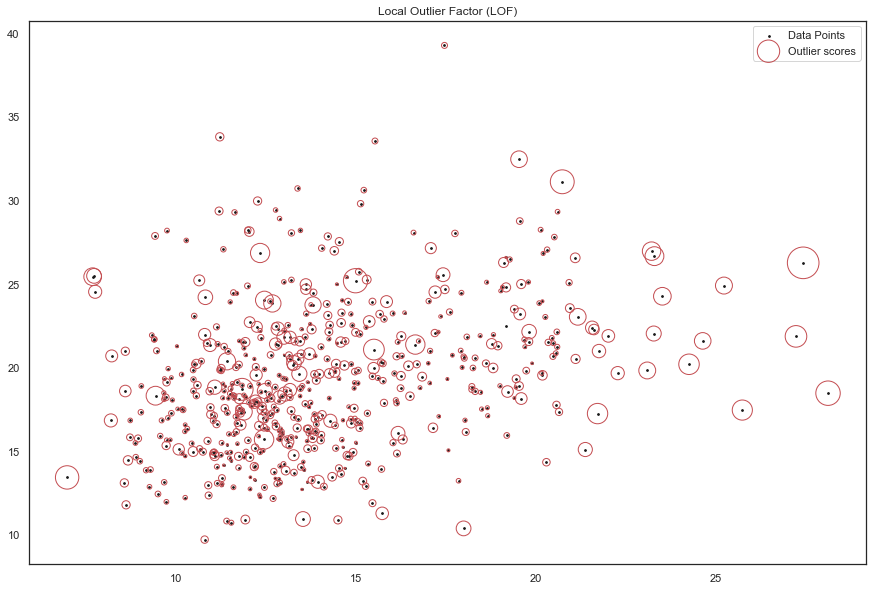

In [49]:
# https://scikit-learn.org/stable/auto_examples/neighbors/plot_lof_outlier_detection.html

plt.figure(figsize=(15,10))
plt.title("Local Outlier Factor (LOF)")
plt.scatter(X.iloc[:,0], X.iloc[:,1], color = "k", s = 3, label = "Data Points")

# plot circles with radius proportional to the outlier scores
radius = (X_scores.max() - X_scores) / (X_scores.max() - X_scores.min())
plt.scatter(
    X.iloc[:, 0],
    X.iloc[:, 1],
    s=1000 * radius,
    edgecolors="r",
    facecolors="none",
    label="Outlier scores",
)
plt.legend()
plt.show()

In [50]:
filt = outliers["values"] == -1
outlier_index = outliers[filt].index.tolist()

In [51]:
#Outliers were removed from the data.
X = X.drop(outlier_index)
y = y.drop(outlier_index).values

In [52]:
print(X.shape)
print(y.shape)

(557, 30)
(557,)


Projecting the 30-dimensional data to 2D


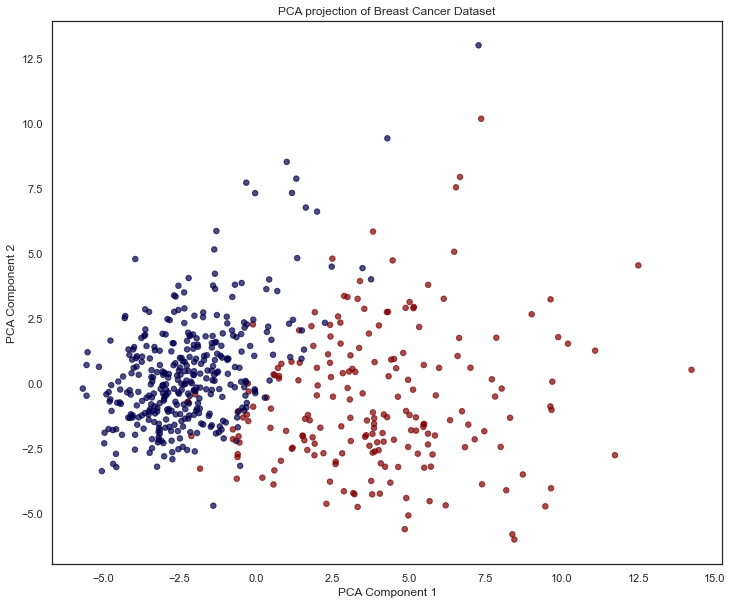

In [53]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA


X_scaled = StandardScaler().fit_transform(X)

pca = PCA(n_components=2)
X_pca_scaled = pca.fit_transform(X_scaled)

print('Projecting the 30-dimensional data to 2D')

plt.figure(figsize=(12,10))
plt.scatter(X_pca_scaled[:, 0], X_pca_scaled[:, 1], c=y, alpha=0.7, s=30, cmap = 'seismic');
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('PCA projection of Breast Cancer Dataset');

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 557 samples in 0.000s...
[t-SNE] Computed neighbors for 557 samples in 0.024s...
[t-SNE] Computed conditional probabilities for sample 557 / 557
[t-SNE] Mean sigma: 1.443837
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.196274
[t-SNE] KL divergence after 1000 iterations: 0.958265


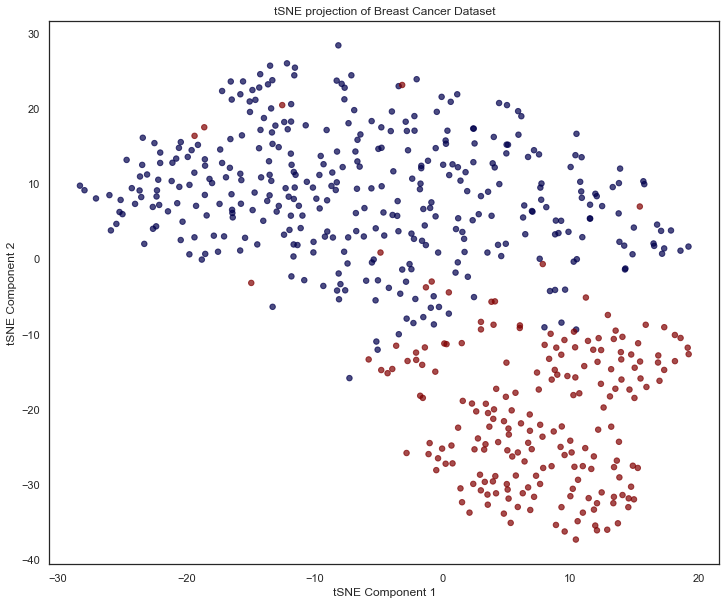

In [54]:
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE


X_scaled = StandardScaler().fit_transform(X)

tSNE = TSNE(n_components=2, verbose = 1)#perplexity=40, n_iter=1000 can be used too 
tSNE_results = tSNE.fit_transform(X_scaled)


plt.figure(figsize=(12,10))
plt.scatter(tSNE_results[:, 0], tSNE_results[:, 1], c=y, alpha=0.7, s=30, cmap = 'seismic');
plt.xlabel('tSNE Component 1')
plt.ylabel('tSNE Component 2')
plt.title('tSNE projection of Breast Cancer Dataset');